In [137]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import missingno as msn
import seaborn as sns
import plotly.express as px

In [138]:
df = pd.read_csv('train_airlines.csv')

In [139]:
px.box(df, y='Food and drink', color='Gender', width=800, height=400)

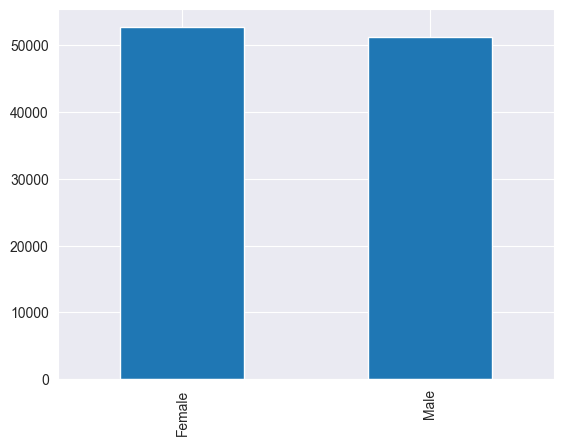

In [140]:
df['Gender'].value_counts().plot(kind='bar')
plt.show()

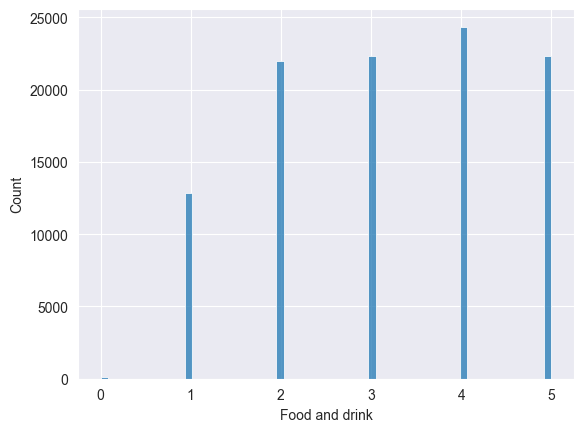

-0.1512794969916901

In [141]:
sns.histplot(df, x='Food and drink')
plt.show()

df['Food and drink'].skew()

In [142]:
df.drop(['Unnamed: 0', 'id'], axis=1, inplace=True)

Test de normalidad en la distribución: test de Kolmogorov-Smirnov o el test de Shapiro-Wilk

In [143]:
x = df['Food and drink']

In [144]:
from scipy import stats
if stats.kstest(x, stats.norm.cdf)[0] < 0.05: print('Reject H0: No Normal Distribution')
else: print('No rejection of H0: Distribution is Normal')

No rejection of H0: Distribution is Normal


In [145]:
from scipy import stats
if stats.shapiro(x)[0] < 0.05: print('Reject H0: No Normal Distribution')
else: print('No rejection of H0: Distribution is Normal')

No rejection of H0: Distribution is Normal


c:\Users\richi\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\stats\_morestats.py:1800: UserWarning:

p-value may not be accurate for N > 5000.



In [146]:
df.satisfaction.value_counts()

neutral or dissatisfied    58879
satisfied                  45025
Name: satisfaction, dtype: int64

Comparar variable ordinal vs categorica --> U de Mann-Whitney. Comprobar homocedasticidad --> test de Levene y test de Fligner-Killeen

Un ejemplo del uso de la prueba U de Mann-Whitney puede encontrarse en un estudio para entender si las actitudes hacia la discriminación salarial, donde las actitudes se miden en una escala ordinal, difieren en función del género.

En este ejemplo, la variable dependiente sería “actitudes hacia la discriminación salarial” y su variable independiente sería “género”, la cual tiene dos grupos: “hombre” y “mujer”.

La variable dependiente debe medirse a nivel ordinal o continuo

La variable independiente debe consistir en dos grupos categóricos e independientes. Algunos ejemplos de variables independientes que cumplen este criterio son el género (2 grupos: hombre o mujer), el estado de empleo (2 grupos: empleado o desempleado), fumador (2 grupos: sí o no), etc.

Segun Palote NOrio, se puede usar Chi2 en este caso. Tabla de contingencia: Filas (Y), Columnas (X)

No se puede usar t de student, no hay variación fija entre los valores ordenados (?)

### U de Mann-Whitney

In [147]:
pvalue = stats.mannwhitneyu(df[df.satisfaction == 'neutral or dissatisfied']['Food and drink'], df[df.satisfaction == 'satisfied']['Food and drink'])[1]
if pvalue < 0.05:print('Reject H0 (Diferencia de medianas no significativa) --> Hay diferencia significativa entre las medianas')
else: print('No Reject H0 (Diferencia de medianas no significativa) --> No hay diferencia significativa entre las medianas')

Reject H0 (Diferencia de medianas no significativa) --> Hay diferencia significativa entre las medianas


In [148]:
pvalue = stats.mannwhitneyu(df[df.Gender == 'Male']['Food and drink'], df[df.Gender == 'Female']['Food and drink'])[1]
if pvalue < 0.05: print('Reject H0 (Diferencia de medianas no significativa) --> Hay diferencia significativa entre las medianas')
else: print('No Reject H0 (Diferencia de medianas no significativa) --> No hay diferencia significativa entre las medianas')

No Reject H0 (Diferencia de medianas no significativa) --> No hay diferencia significativa entre las medianas


### T student + Prueba de Levene (test de igualdad de varianzas)

In [149]:
pvalue = stats.ttest_ind(df[df.satisfaction == 'neutral or dissatisfied']
                         ['Flight Distance'], df[df.satisfaction == 'satisfied']['Flight Distance'])[1]
if pvalue < 0.05: print('Reject H0 (No hay relación entre medias) --> Hay diferencia entre las medias')
else: print('No Reject H0 (No hay relación entre medias) --> No hay diferencia entre las medias')

Reject H0 (No hay relación entre medias) --> Hay diferencia entre las medias


### F Fisher + Prueba de Levene (test de igualdad de varianzas) - Comparar más de 2 grupos

In [150]:
pvalue = stats.f_oneway(df[df.satisfaction == 'neutral or dissatisfied']['Flight Distance'], df[df.satisfaction == 'satisfied']['Flight Distance'])[1]
if pvalue < 0.05:
    print('Reject H0 (No hay relación entre medias) --> Hay diferencia entre las medias')
else:
    print('No Reject H0 (No hay relación entre medias) --> No hay diferencia entre las medias')

Reject H0 (No hay relación entre medias) --> Hay diferencia entre las medias


### Chi2

In [151]:
ct = pd.crosstab(df.satisfaction, df['Food and drink'])
pvalue= stats.chi2_contingency(ct)[1]
if pvalue < 0.05: print('Reject H0 (No hay relación entre medias) --> Hay diferencia entre las medias')
else: print('No Reject H0 (No hay relación entre medias) --> No hay diferencia entre las medias')

Reject H0 (No hay relación entre medias) --> Hay diferencia entre las medias


### V de cramer - Medir magnitud de la asociación entre las variables

In [152]:
#Forma 1
from scipy.stats.contingency import association
print(association(ct, method='cramer'))

0.22377966594833737


In [153]:
#Forma 2
X2 = pvalue = stats.chi2_contingency(ct)[0]
N = np.sum(ct.to_numpy())
dimension = min(ct.shape)-1
V = np.sqrt((X2/N)/dimension)
V

0.22377966594833737

In [154]:
df.replace({'Gender':{'Male':0, 'Female':1}, 'Customer Type':{'Loyal Customer':0, 'disloyal Customer':1}, 'Type of Travel':{'Personal Travel':0, 'Business travel':1}, 'satisfaction':{'neutral or dissatisfied':0, 'satisfied':1}}, inplace=True)

In [155]:
tstu_var = ['Age', 'Flight Distance', 'Departure Delay in Minutes', 'Arrival Delay in Minutes']
chi2_var = [i for i in df.columns if i not in tstu_var and i != 'satisfaction']

### Chi2 and V Cramer - Categorica/Ordinal vs Categorica

In [156]:
sig = []
p =[]
v = []
for i in chi2_var:
    ct = pd.crosstab(df.satisfaction, df[i])
    pvalue = stats.chi2_contingency(ct)[1]
    p.append(pvalue)
    v.append(association(ct, method='cramer'))
    if pvalue < 0.05: sig.append('significant')
    else:  sig.append('not significant')

In [157]:
chi2_tab = pd.DataFrame({'Feature':chi2_var, 'p_value':p, 'significance':sig, 'V_cramer':v})
chi2_tab.sort_values(by='V_cramer', ascending=False)

,Feature,p_value,significance,V_cramer
9,Online boarding,0.000000e+00,significant,0.618526
4,Inflight wifi service,0.000000e+00,significant,0.525530
3,Class,0.000000e+00,significant,0.504750
2,Type of Travel,0.000000e+00,significant,0.449000
11,Inflight entertainment,0.000000e+00,significant,0.422050
10,Seat comfort,0.000000e+00,significant,0.389411
13,Leg room service,0.000000e+00,significant,0.343661
12,On-board service,0.000000e+00,significant,0.332808
6,Ease of Online booking,0.000000e+00,significant,0.316489
17,Cleanliness,0.000000e+00,significant,0.314010


### T Student Cuantitativa (dependiente) vs Categorica (independiente)

Prueba de Levene

In [158]:
from scipy.stats import levene
sig = []
p = []
for i in tstu_var:
    pvalue = stats.levene(df[df.satisfaction == 0][i], df[df.satisfaction == 1][i])[1]
    p.append(pvalue)
    if pvalue < 0.05: sig.append('significant')
    else: sig.append('not significant')

In [159]:
tstu_tab = pd.DataFrame(
    {'Feature': tstu_var, 'p_value': p, 'significance': sig})
tstu_tab

,Feature,p_value,significance
0,Age,0.000000e+00,significant
1,Flight Distance,0.000000e+00,significant
2,Departure Delay in Minutes,1.229346e-59,significant
3,Arrival Delay in Minutes,NaN,not significant


Prueba t Student

La función ttest_ind() también tiene un argumento opcional equal_var que especifica si se asume igualdad de varianzas entre las dos muestras. El valor predeterminado es True, pero si se desea utilizar la versión Welch's t-test, que no asume igualdad de varianzas, el argumento debe ser False.

In [160]:
sig = []
p = []
equal_var = True
for i in tstu_var:
    lev_pvalue = stats.levene(df[df.satisfaction == 0][i], df[df.satisfaction == 1][i])[1]
    if lev_pvalue < 0.05: equal_var = False
    else: equal_var = True
    pvalue = stats.ttest_ind(df[df.satisfaction == 0][i], df[df.satisfaction == 1][i], nan_policy='omit', equal_var=equal_var)[1]
    p.append(pvalue)
    if pvalue < 0.05: sig.append('significant')
    else: sig.append('not significant')

In [161]:
tstu_tab = pd.DataFrame({'Feature': tstu_var, 'p_value': p, 'significance': sig})
tstu_tab

,Feature,p_value,significance
0,Age,0.000000e+00,significant
1,Flight Distance,0.000000e+00,significant
2,Departure Delay in Minutes,1.276708e-61,significant
3,Arrival Delay in Minutes,8.391470e-77,significant


### Correlation Matrix

C:\Users\richi\AppData\Local\Temp\ipykernel_9436\4182161881.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



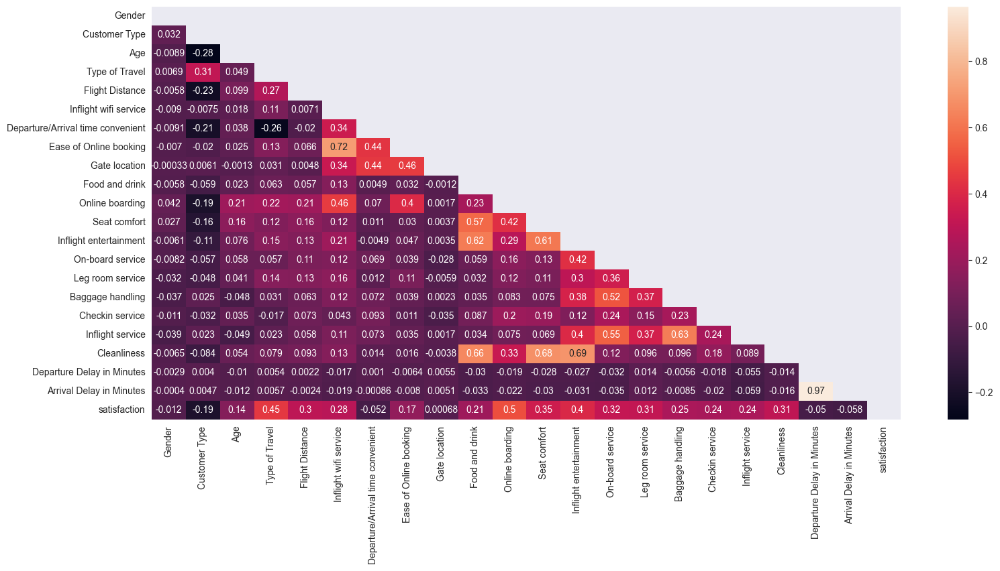

In [162]:
cor = df.corr(method='pearson')
mask = np.zeros_like(cor, dtype=bool)
mask[np.triu_indices_from(mask)] = True
plt.figure(figsize=(18, 8))
sns.heatmap(cor, mask=mask, annot=True)
plt.show()


## Feature Importance

### Logistic Regression - Importances (Coef)

In [163]:
set = df.dropna()

In [164]:
Y = set.satisfaction
X = set.drop(['Class', 'satisfaction'], axis=1)

In [165]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_norm = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)

In [166]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X_norm, Y, test_size=0.25, stratify=Y, random_state=42)

In [167]:
from sklearn.linear_model import LogisticRegression
model = LogisticRegression()
model.fit(X_train, Y_train)
importances_log = pd.DataFrame({'Features':X_train.columns, 'Coef':model.coef_[0]}).sort_values(by='Coef', ascending=False).reset_index(drop=True)
importances_log

,Features,Coef
0,Type of Travel,1.443439
1,Online boarding,0.892196
2,Inflight wifi service,0.464736
3,Checkin service,0.430987
4,On-board service,0.424776
5,Leg room service,0.339876
6,Cleanliness,0.289495
7,Departure Delay in Minutes,0.216373
8,Baggage handling,0.194081
9,Inflight service,0.172060


In [168]:
px.bar(importances_log, x='Features', y='Coef')

### Tree-Based Model

In [169]:
from xgboost import XGBClassifier
model = XGBClassifier()
model.fit(X_train, Y_train)
importances_tree = pd.DataFrame({'Features':X.columns, 'Importance':model.feature_importances_}).sort_values(by='Importance', ascending=False)
importances_tree

,Features,Importance
10,Online boarding,0.420517
3,Type of Travel,0.158124
5,Inflight wifi service,0.099166
1,Customer Type,0.071506
12,Inflight entertainment,0.047708
16,Checkin service,0.029873
13,On-board service,0.024034
11,Seat comfort,0.022338
18,Cleanliness,0.021946
15,Baggage handling,0.021143


In [170]:
px.bar(importances_tree, x='Features', y='Importance')

### Feature Importance using PCA

In [171]:
from sklearn.decomposition import PCA
model = PCA()
results = model.fit_transform(X_train)

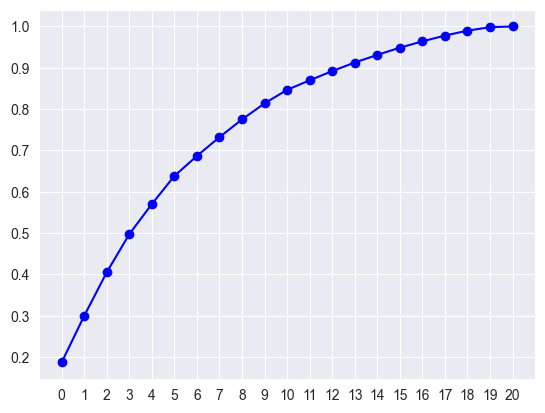

In [172]:
plt.plot(model.explained_variance_ratio_.cumsum(), 'o-b')
plt.xticks(np.arange(min(range(0, model.n_components_)),
           max(range(2, model.n_components_))+1, 1))
plt.show()

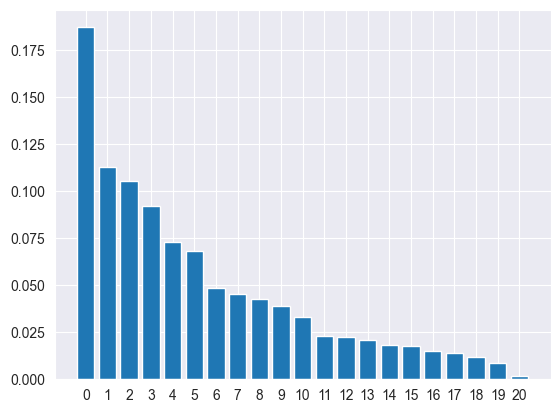

In [173]:
plt.bar(np.arange(0, model.n_components_), height=model.explained_variance_ratio_)
plt.xticks(np.arange(min(range(0, model.n_components_)), max(range(2, model.n_components_))+1, 1))
plt.show()

In [174]:
pca = PCA(n_components=7)
X_pca = pca.fit_transform(X_train)

In [175]:
col = ['PC'+str(i) for i in range(0, pca.n_components_)]
loadings = pd.DataFrame(pca.components_.T*np.sqrt(pca.explained_variance_), columns=col, index=X_train.columns)
loadings

,PC0,PC1,PC2,PC3,PC4,PC5,PC6
Gender,0.015388,-0.000334,0.068468,-0.002438,0.073216,0.004034,-0.868841
Customer Type,0.180015,0.077588,-0.169399,0.015064,0.710386,-0.399441,-0.083026
Age,-0.157938,-0.036089,0.188480,-0.011938,-0.276999,0.546993,-0.011323
Type of Travel,-0.209226,0.044118,0.049376,0.055793,0.780948,0.317286,0.096038
Flight Distance,-0.263817,0.025908,0.058487,0.044162,0.084182,0.614625,0.192335
Inflight wifi service,-0.454332,-0.682125,0.015017,-0.014907,0.198743,-0.058818,-0.045284
Departure/Arrival time convenient,-0.189338,-0.655115,-0.062391,-0.025603,-0.421970,-0.197941,0.010403
Ease of Online booking,-0.327244,-0.817588,0.021217,-0.014127,0.194371,0.013816,-0.005557
Gate location,-0.126725,-0.664018,0.005982,-0.016275,0.006500,-0.223839,0.151314
Food and drink,-0.591173,0.228218,0.477107,-0.010255,-0.002294,-0.329310,0.079885


In [176]:
px.bar(loadings, y=col)

In [177]:
def biplot(pc1, pc2, points, coeff, labels):
    xs = points[:,pc1]
    ys = points[:,pc2]
    scalex = 1.0/(xs.max() - xs.min())
    scaley = 1.0/(ys.max() - ys.min())
    plt.figure(figsize=(10,8))
    plt.scatter(xs*scalex, ys*scaley)
    for i in range(coeff.shape[0]):
        plt.arrow(0, 0, coeff[i,pc1], coeff[i,pc2], color='r')
        plt.text(coeff[i,pc1]* 1.15, coeff[i,pc2] * 1.15, labels[i], color = 'black', ha = 'center', va = 'center')

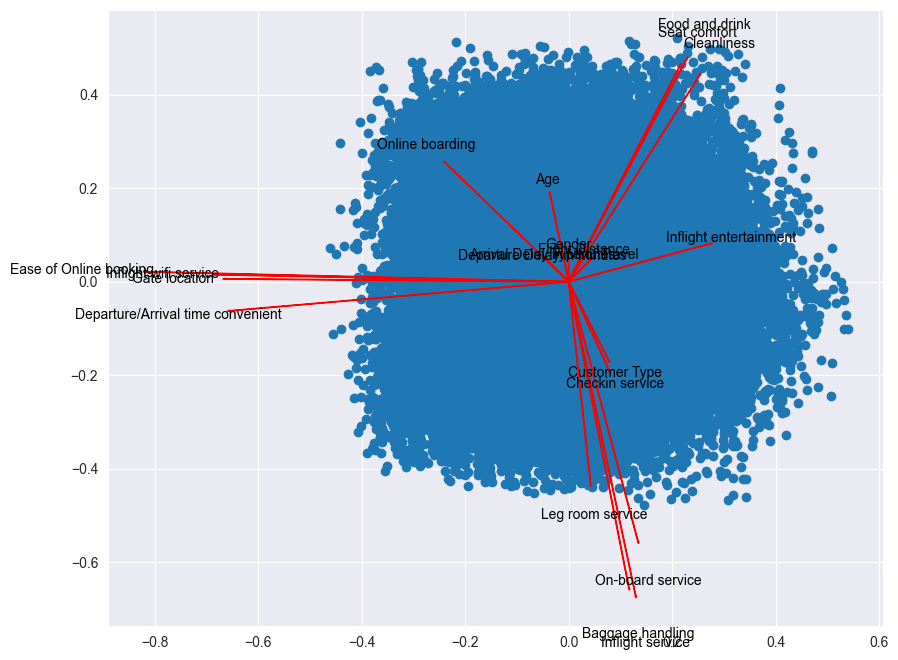

In [178]:
biplot(1, 2, X_pca, pca.components_.T*np.sqrt(pca.explained_variance_), X_train.columns)

## Factor Analysis

We'll keep survey variables --> Features valued by the customer

In [179]:
fa_set_norm = X_norm[[col for col in df.columns if len(df[col].unique()) >= 5 and len(df[col].unique()) <= 6]]
fa_set = X[fa_set_norm.columns]
rest_vars_norm = X_norm[[i for i in X_norm.columns if i not in fa_set.columns]]
rest_vars = X[rest_vars_norm.columns]

*Kaiser-Meyer-Olkin (KMO) test.*

KMO Test measures the proportion of variance that might be common variance among the variables. Larger proportions are expected as it represents more correlation is present among the variables there by giving way for application of dimensionality reduction techniques such as Factor Analysis. KMO score is always between 0 to 1 and values more than 0.6 are much appreciated. We can also say it as a measure of how suited our data is for factor analysis.

In [180]:
from factor_analyzer.factor_analyzer import calculate_kmo
kmo_var, kmo_model = calculate_kmo(fa_set_norm)
kmo = pd.DataFrame({'Feature':fa_set_norm.columns, 'kmo':kmo_var})
kmo

,Feature,kmo
0,Inflight wifi service,0.741874
1,Departure/Arrival time convenient,0.752781
2,Ease of Online booking,0.681642
3,Gate location,0.706627
4,Food and drink,0.840904
5,Online boarding,0.736463
6,Seat comfort,0.832942
7,Inflight entertainment,0.767890
8,On-board service,0.828932
9,Leg room service,0.889804


In [181]:
kmo_model

0.7812331875744178

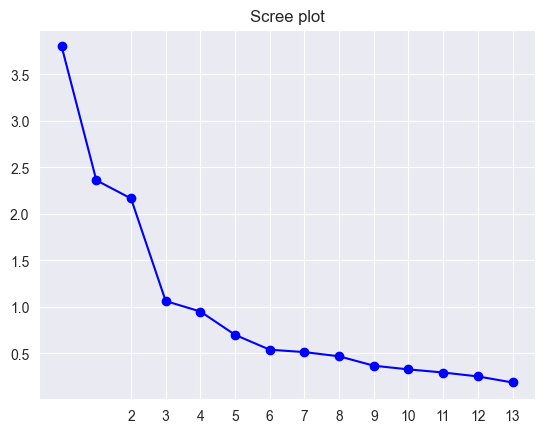

In [182]:
from factor_analyzer import FactorAnalyzer
fa = FactorAnalyzer(rotation='varimax')
fa.fit(fa_set_norm)
ev, v = fa.get_eigenvalues()
plt.plot(ev, 'o-b')
plt.xticks(np.arange(min(range(2, fa_set_norm.shape[1])), max(range(2, fa_set_norm.shape[1]))+1, 1))
plt.title('Scree plot')
plt.show()

In [183]:
n_factors = np.where(ev == min([i for i in ev if i>=1 and i<2]))[0][0]
n_factors

3

In [184]:
fa = FactorAnalyzer(n_factors=n_factors, rotation='varimax')
fa.fit(fa_set_norm)
X_fa = fa.transform(fa_set_norm)

In [185]:
loadings = pd.DataFrame(fa.loadings_, index=fa_set_norm.columns)
loadings

,0,1,2
Inflight wifi service,0.168261,0.128395,0.757998
Departure/Arrival time convenient,-0.029322,0.059462,0.501282
Ease of Online booking,0.030299,0.020867,0.932981
Gate location,-0.033980,-0.032280,0.503969
Food and drink,0.752545,0.010973,0.006215
Online boarding,0.395492,0.113669,0.358967
Seat comfort,0.790017,0.081440,0.027127
Inflight entertainment,0.745645,0.467033,0.012231
On-board service,0.093905,0.701055,0.028882
Leg room service,0.074355,0.481625,0.080574


In [186]:
variance = pd.DataFrame(fa.get_factor_variance(), index=['variance', 'variance rate', 'cum_variance'])
variance

,0,1,2
variance,2.706579,2.296400,2.089330
variance rate,0.193327,0.164029,0.149238
cum_variance,0.193327,0.357356,0.506593


In [187]:
loadings[loadings[0].abs()>0.5][0].abs().sort_values(ascending=False)

Cleanliness               0.858336
Seat comfort              0.790017
Food and drink            0.752545
Inflight entertainment    0.745645
Name: 0, dtype: float64

In [188]:
communalities = pd.DataFrame({'communalities':fa.get_communalities()}, index=fa_set_norm.columns).sort_values(by='communalities', ascending=False)
communalities

,communalities
Ease of Online booking,0.871808
Inflight entertainment,0.774255
Cleanliness,0.744526
Inflight service,0.640596
Seat comfort,0.631496
Inflight wifi service,0.619357
Baggage handling,0.586501
Food and drink,0.566482
On-board service,0.501130
Online boarding,0.298192


In [189]:
max_load = loadings.abs().max(axis=1).reset_index()
max_load.columns = ['feature', 'max_loading']

In [190]:
max_load[max_load.max_loading < 0.5]

,feature,max_loading
5,Online boarding,0.395492
9,Leg room service,0.481625
11,Checkin service,0.284207


In [191]:
idx_2 = loadings.T.abs().idxmax().reset_index()
idx_2.columns = ['feature', 'factor']
# for f in loadings.columns:
#     idx_2[idx_2.factor==f]

In [192]:
idx_2[idx_2.factor==0]

,feature,factor
4,Food and drink,0
5,Online boarding,0
6,Seat comfort,0
7,Inflight entertainment,0
13,Cleanliness,0


### ¡¡¡¡ USE LOADING CUTOFF >=0.5 !!!!

In [193]:
idx = loadings.T.abs().idxmax().reset_index()
idx.columns = ['feature', 'factor']
factors = {}
for i in range(loadings.shape[1]):
    factors['fact_'+str(i)] = list(idx_2[idx_2.factor == i].feature)
factors

{'fact_0': ['Food and drink',
  'Online boarding',
  'Seat comfort',
  'Inflight entertainment',
  'Cleanliness'],
 'fact_1': ['On-board service',
  'Leg room service',
  'Baggage handling',
  'Checkin service',
  'Inflight service'],
 'fact_2': ['Inflight wifi service',
  'Departure/Arrival time convenient',
  'Ease of Online booking',
  'Gate location']}

Now, that's great, but how do we know if our factors are any good? Well, the Cronbach alpha can be used to measure whether or not the variables of a factor form a “coherent” and reliable factor. A value above 0.6 for the alpha is in practice deemed acceptable.

In [194]:
import pingouin as pg
for factor in factors:
    print(factor, factors[factor])
    print(pg.cronbach_alpha(fa_set_norm[factors[factor]]))

fact_0 ['Food and drink', 'Online boarding', 'Seat comfort', 'Inflight entertainment', 'Cleanliness']
(0.8391759035325788, array([0.838, 0.841]))
fact_1 ['On-board service', 'Leg room service', 'Baggage handling', 'Checkin service', 'Inflight service']
(0.7427517082206969, array([0.74 , 0.745]))
fact_2 ['Inflight wifi service', 'Departure/Arrival time convenient', 'Ease of Online booking', 'Gate location']
(0.7702821807639149, array([0.768, 0.773]))


In [195]:
F0 = fa_set[factors['fact_0']].mean(axis=1)
F1 = fa_set[factors['fact_1']].mean(axis=1)
F2 = fa_set[factors['fact_2']].mean(axis=1)

In [196]:
fa_df = pd.DataFrame({'F0':F0, 'F1':F1, 'F2':F2})
# scaler = StandardScaler()
# fa_df = pd.DataFrame(scaler.fit_transform(fa_df), columns=fa_df.columns)
fa_df['satisfaction'] = Y

In [197]:
fa_df

,F0,F1,F2,satisfaction
0,4.6,4.0,2.75,0
1,1.4,2.8,2.75,0
2,5.0,3.8,2.00,1
3,2.0,3.0,4.25,0
4,4.0,3.4,3.00,1
...,...,...,...,...
103899,2.0,2.6,2.00,0
103900,4.0,5.0,4.00,1
103901,3.6,3.8,1.50,0
103902,1.0,3.8,2.00,0


### !!!!!!!!!!!!!!!!!!!!!!!!!!!! Construct a biplot

In [198]:
fig = px.scatter_3d(fa_df, x='F0', y='F1', z='F2', color='satisfaction', opacity=0.5)
fig.update_traces(marker=dict(size=3))
fig.show()

Evaluation Metrics

In [199]:
from sklearn.metrics import roc_curve, roc_auc_score
def roc(true, pred):
    fpr, tpr, _ = roc_curve(true, pred)
    auc = roc_auc_score(true, pred)
    sns.set_style('darkgrid')
    sns.lineplot(x=fpr, y=tpr, label="AUC: "+str(auc))
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend()
    plt.show()
    plt.close()

### Key Drivers --> !!!! USAR mean(X1, ..Xi) que componen al Factor, no la proyección ortogonal

In [200]:
fa_df.dropna(inplace=True)

In [201]:
X = fa_df.drop(['satisfaction'], axis=1)
Y = fa_df.satisfaction

In [202]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, stratify=Y, random_state=42)

In [226]:
from sklearn.linear_model import LogisticRegression
lg = LogisticRegression(max_iter=1000)
lg.fit(X_train, Y_train)
print(lg.n_iter_[0])
print(lg.feature_names_in_)
print(lg.coef_, lg.intercept_)
for i in lg.coef_[0]:
    print(i/np.sum(lg.coef_[0])*100,'%')

15
['F0' 'F1' 'F2']
[[0.97039575 0.89422139 0.13972387]] [-7.12365046]
48.41470306895687 %
44.61423428213414 %
6.971062648908999 %


scikit-learn no tiene manera de determinar los p-valores para los coeficientes de la regresión, entonces usamos stasmodels.api entrenando una regresion logistica con esta libreria. Se debe añadir una constante a los datos X porque sm no incluye de manera automática el intercepto, añadiendo la columna de constantes se representa este mismo

In [227]:
import statsmodels.api as sm
X_train_sm = sm.add_constant(X_train)
logit_model = sm.Logit(Y_train, X_train_sm)
result = logit_model.fit()
p_values = result.pvalues

Optimization terminated successfully.
         Current function value: 0.517733
         Iterations 6


In [233]:
result.summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                         Results: Logit
=================================================================
Model:              Logit            Pseudo R-squared: 0.243     
Dependent Variable: satisfaction     AIC:              75094.7486
Date:               2023-02-08 12:56 BIC:              75131.5148
No. Observations:   72515            Log-Likelihood:   -37543.   
Df Model:           3                LL-Null:          -49618.   
Df Residuals:       72511            LLR p-value:      0.0000    
Converged:          1.0000           Scale:            1.0000    
No. Iterations:     6.0000                                       
-------------------------------------------------------------------
         Coef.    Std.Err.       z       P>|z|     [0.025    0.975]
-------------------------------------------------------------------
const   -7.1244     0.0588   -121.2394   0.0000   -7.2396   -7.0092
F0       0.9705     0.0102     95.1865   0.0000    0.9505    0.9905
F1       0.8943     0.0116     76.9703   0.0000    0.8716    0.9171
F2       0.1397     0.0084     16.5685   0.0000    0.1232    0.1563
=================================================================

"""

In [253]:
sig = pd.DataFrame({'coef':p_values.index, 'p-value': p_values.values, 'sig':p_values < 0.05})

Los valores p indican la significaión estadística de cada coeficiente del modelo. UN valor p menor a un cierto nivel de significancia (alpha = 0.05) indica que el coeficiente es estadísticamente significativo y que su efecto en la variable dependiente es real. Por el contrario, un valor p mayor a un nivel de significancia indica que el coeficiente es estadísticamente no significativo y que su efecto en la variable dependiente es problablemente debido al azar

In [254]:
sig

,coef,p-value,sig
const,const,0.000000e+00,True
F0,F0,0.000000e+00,True
F1,F1,0.000000e+00,True
F2,F2,1.177112e-61,True


Cuando existe autocorrelación en los residuos, los coeficientes del modelo pueden ser subestimados o sobrestimados, lo que puede afectar negativamente la precisión y la estabilidad del modelo. Por lo tanto, es importante detectar y corregir la autocorrelación en los residuos de una regresión lineal.

En una regresión logística, los residuos no son la diferencia entre los valores observados y los valores predichos, sino que se basan en la función de verosimilitud del modelo. En lugar de utilizar los residuos, una forma de detectar la autocorrelación en una regresión logística es mediante la evaluación de la estabilidad del coeficiente del modelo a través del tiempo.

Detección de autocorrelación en el modelo -> Test de Ljung-Box o Evaluación de estabilidad de coeficientes

#### Test de Ljung-Box

In [ ]:
from statsmodels.stats.diagnostic import acorr_ljungbox
residuals = Y_train - lg.predict(X_train)
p_value = acorr_ljungbox(residuals, lags=[10]).lb_pvalue.values[0]
if p_value < 0.05: print('Rechazamos H0 (residuos del modelo independientes)')
else: print('No rechazamos H0 (residuos del modelo independientes)')

c:\Users\richi\AppData\Local\Programs\Python\Python311\Lib\site-packages\outdated\utils.py:14: OutdatedCheckFailedWarning:

Failed to check for latest version of package.
Set the environment variable OUTDATED_RAISE_EXCEPTION=1 for a full traceback.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.



No rechazamos H0 (residuos del modelo independientes)


#### Evaluación de estabilidad de los coeficientes mediante Validación Cruzada

In [ ]:
y = set.satisfaction
X_norm
y

0         0
1         0
2         1
3         0
4         1
         ..
103899    0
103900    1
103901    0
103902    0
103903    0
Name: satisfaction, Length: 103594, dtype: int64

In [ ]:
from sklearn.metrics import make_scorer, precision_score
from sklearn.model_selection import cross_validate, cross_val_score, KFold

In [ ]:
CV_data = {}
c = 0
kf = KFold(n_splits=5)
for train_index, test_index in kf.split(X):
   CV_data['X_train_'+str(c)] = X.iloc[train_index]
   CV_data['y_train_'+str(c)] = Y.iloc[train_index]
   CV_data['X_test_'+str(c)] = X.iloc[test_index]
   CV_data['y_test_'+str(c)] = Y.iloc[test_index]
   c+=1

In [ ]:
model = LogisticRegression()
scorer = make_scorer(precision_score)
scores = cross_validate(model, X, Y, scoring=scorer, cv=kf, return_estimator=True)

In [ ]:
scores['estimator'][0]

LogisticRegression()

In [ ]:
for i in scores['estimator']:
    print(i.coef_)

[[0.95947078 0.88957743 0.13260008]]
[[0.96622502 0.89967937 0.13207661]]
[[0.96740064 0.89499781 0.13334333]]
[[0.96176957 0.89646611 0.13100351]]
[[0.95379282 0.87962286 0.12692534]]


Una forma de determinar si los coeficientes varían significativamente entre los subconjuntos es mediante el cálculo de un intervalo de confianza para cada coeficiente. Un intervalo de confianza es un intervalo en el que se espera que el valor verdadero del parámetro se encuentre con un cierto nivel de confianza. Si los intervalos de confianza de los coeficientes para cada subconjunto se solapan entre sí, es probable que los coeficientes no varíen significativamente entre los subconjuntos.

IC = coeficiente_ij ± t_critical * SE_ij
coeficiente_ij es el coeficiente i en el subconjunto j
t_critical es el valor crítico de la distribución t-student para el nivel de confianza deseado (por ejemplo, el 95%) y el grado de libertad (que se calcula como el tamaño de la muestra menos el número de predictores)
SE_ij es la desviación estándar del coeficiente i en el subconjunto j


El nivel de confianza se refiere al porcentaje de intervalos de confianza que se espera que contengan al valor verdadero. Por ejemplo, si se utiliza un nivel de confianza del 95%, se espera que el intervalo de confianza contenga al valor verdadero en el 95% de las muestras. Por lo tanto, el percentil superior del intervalo de confianza se calcula sumando el nivel de confianza al 100% (1).

En el caso del código que te di anterior, se utiliza la función ppf de la librería scipy.stats para calcular el percentil superior del intervalo de confianza para un nivel de confianza del 95% y un grado de libertad dado. Por lo tanto, el argumento de entrada de la función es (1 + 0.95) / 2 = 0.975. Este percentil superior es el valor crítico que se utiliza para calcular el límite superior del intervalo de confianza.

En resumen, se suma 1 al nivel de confianza para calcular el percentil superior del intervalo de confianza y no para calcular el percentil correspondiente al nivel de confianza deseado.

In [ ]:
coef_dict = {}
B0 = {}
c = 0
for i in scores['estimator']:
    B0['B0_model_'+str(c)] = i.intercept_[0]
    coef_dict['coef_model_'+str(c)] = i.coef_[0]
    c+=1

In [ ]:
coef_dict

{'coef_model_0': array([0.95947078, 0.88957743, 0.13260008]),
 'coef_model_1': array([0.96622502, 0.89967937, 0.13207661]),
 'coef_model_2': array([0.96740064, 0.89499781, 0.13334333]),
 'coef_model_3': array([0.96176957, 0.89646611, 0.13100351]),
 'coef_model_4': array([0.95379282, 0.87962286, 0.12692534])}

Cuando se trata de regresión logística binaria, el valor de y_hat es la probabilidad predicha de la clase positiva, es decir, la segunda columna de la matriz devuelta por predict_proba

In [ ]:
from scipy.stats import t
confidence_level = 0.95
deg_free = len(CV_data['X_test_'+str(0)]) - len(CV_data['X_test_'+str(0)].columns)
t_critical = t.ppf((1+confidence_level) / 2, deg_free)

In [ ]:
IC = {}
for i in range(0,len(coef_dict['coef_model_0'])):
    for j in range(0, len(coef_dict)):
        SE = np.sqrt(np.diag(np.linalg.inv(CV_data['X_test_'+str(j)].T @ CV_data['X_test_'+str(j)]))) * np.std(scores['estimator'][j].predict_proba(CV_data['X_test_'+str(j)])[:, 1] - CV_data['y_test_'+str(j)], ddof=1)
        IC['IC_'+str(i)+str(j)] = (coef_dict['coef_model_'+str(j)][i] - t_critical * SE[i], coef_dict['coef_model_'+str(j)][i] + t_critical * SE[i])

In [ ]:
IC

{'IC_00': (0.9542560670581255, 0.9646854945474619),
 'IC_01': (0.960933231793289, 0.9715168156876905),
 'IC_02': (0.9621243484180853, 0.9726769232906567),
 'IC_03': (0.9564550739271495, 0.9670840687056127),
 'IC_04': (0.9485359865085974, 0.9590496484104194),
 'IC_10': (0.884222764989425, 0.8949320893440582),
 'IC_11': (0.8943033396408014, 0.9050554071931299),
 'IC_12': (0.8896227563581589, 0.9003728619493359),
 'IC_13': (0.8911046008566788, 0.9018276235153846),
 'IC_14': (0.874289415669283, 0.8849562975669784),
 'IC_20': (0.1277156503129714, 0.13748451279577187),
 'IC_21': (0.12713160571956172, 0.13702160811212877),
 'IC_22': (0.12841128458330595, 0.13827537915974306),
 'IC_23': (0.12609461309197534, 0.1359124069922923),
 'IC_24': (0.12210366852109525, 0.1317470094033841)}

Una forma de determinar si los intervalos de confianza se solapan significativamente entre subconjuntos en el ejemplo anterior es mediante el cálculo de la distancia entre los intervalos de confianza. Puedes calcular la distancia entre los intervalos de confianza de cada coeficiente en cada subconjunto utilizando la fórmula:

distance = abs(IC_1 - IC_2)

IC_1 es el intervalo de confianza del coeficiente en el primer subconjunto
IC_2 es el intervalo de confianza del coeficiente en el segundo subconjunto


Para determinar el valor crítico para la medición de la distancia entre los intervalos de confianza en el ejemplo anterior, puedes utilizar una tabla de valores críticos para distribuciones t-Student o calcularlo utilizando la función ppf de la librería scipy.stats. El valor crítico dependerá del nivel de confianza que desees utilizar, el grado de libertad y el número de subconjuntos utilizados en la validación cruzada.

Por ejemplo, si utilizas un nivel de confianza del 95% y 5 subconjuntos en la validación cruzada, el grado de libertad es el tamaño de la muestra menos el número de predictores menos el número de subconjuntos.

In [ ]:
deg_free = len(CV_data['X_test_'+str(j)]) - len(CV_data['X_test_'+str(j)].columns)
t_critical = t.ppf((1+confidence_level) / 2, deg_free)

Una vez que tienes el valor crítico, puedes compararlo con la distancia entre los intervalos de confianza de cada coeficiente entre subconjuntos para determinar si varían significativamente entre ellos. Si la distancia es mayor que cero y es menor que el valor crítico, los intervalos de confianza se solapan significativamente y los coeficientes no varían significativamente entre los subconjuntos, y por lo tanto, el modelo es estable. Si la distancia es mayor que el valor crítico, los intervalos de confianza no se solapan significativamente, y los coeficientes varían significativamente entre los subconjuntos, y por lo tanto, el modelo no es estable.

In [ ]:
critical_distance = {}
for i in range(0,3):
    critical_distance['critical_distance_'+str(i)] = t_critical * SE[i]
critical_distance

{'critical_distance_0': 0.005256830965738748,
 'critical_distance_1': 0.005333440963891498,
 'critical_distance_2': 0.0048216704547446925}

In [ ]:
from itertools import combinations
for i in range(0,3):
    for comb in list(combinations([0,1,2,3,4], 2)):
        dist = abs(min(IC['IC_'+str(i)+str(comb[0])]) - max(IC['IC_'+str(i)+str(comb[1])]))
        print('IC_'+str(i)+str(comb[0])+' - '+'IC_'+str(i)+str(comb[1]), dist)
        if dist > 0 and dist < critical_distance['critical_distance_'+str(i)]: print('Solapamiento significativo')
        else: print('Solapamiento no significativo')


IC_00 - IC_01 0.01726074862956506
Solapamiento no significativo
IC_00 - IC_02 0.018420856232531202
Solapamiento no significativo
IC_00 - IC_03 0.012828001647487208
Solapamiento no significativo
IC_00 - IC_04 0.0047935813522939075
Solapamiento significativo
IC_01 - IC_02 0.011743691497367648
Solapamiento no significativo
IC_01 - IC_03 0.006150836912323654
Solapamiento no significativo
IC_01 - IC_04 0.0018835833828696469
Solapamiento significativo
IC_02 - IC_03 0.004959720287527447
Solapamiento significativo
IC_02 - IC_04 0.0030747000076658537
Solapamiento significativo
IC_03 - IC_04 0.0025945744832699402
Solapamiento significativo
IC_10 - IC_11 0.020832642203704954
Solapamiento no significativo
IC_10 - IC_12 0.016150096959910876
Solapamiento no significativo
IC_10 - IC_13 0.01760485852595961
Solapamiento no significativo
IC_10 - IC_14 0.0007335325775533752
Solapamiento significativo
IC_11 - IC_12 0.006069522308534414
Solapamiento no significativo
IC_11 - IC_13 0.007524283874583149
Solap

In [ ]:
for m in scores['estimator']:
    px.bar(pd.DataFrame({'Feature':X.columns, 'Coef': m.coef_[0]}), x='Feature', y='Coef', width=800, height=400)

In [ ]:
from sklearn.metrics import make_scorer, precision_score
from sklearn.model_selection import cross_validate

scorer = make_scorer(precision_score)
scores = cross_validate(lg, X, Y, scoring=scorer, cv=5)

In [ ]:
print('Accuracy Train set: ', lg.score(X_train, Y_train))
print('Accuracy Test set: ', lg.score(X_test, Y_test))

Accuracy Train set:  0.7528511342480866
Accuracy Test set:  0.7479970398017954


In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report

              precision    recall  f1-score   support

           0       0.77      0.78      0.78     17610
           1       0.71      0.70      0.71     13469

    accuracy                           0.75     31079
   macro avg       0.74      0.74      0.74     31079
weighted avg       0.75      0.75      0.75     31079



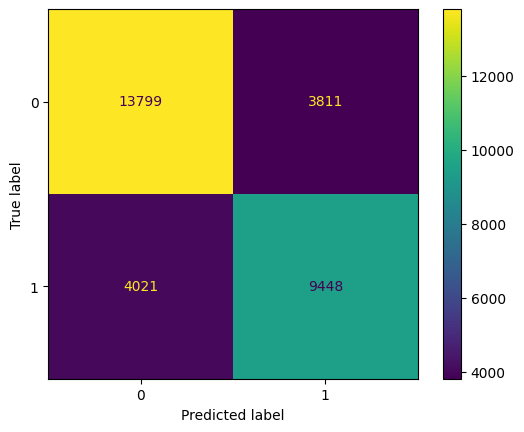

In [ ]:
pred = lg.predict(X_test)
cm = confusion_matrix(Y_test, pred)
ConfusionMatrixDisplay(cm).plot()
print(classification_report(Y_test, pred))

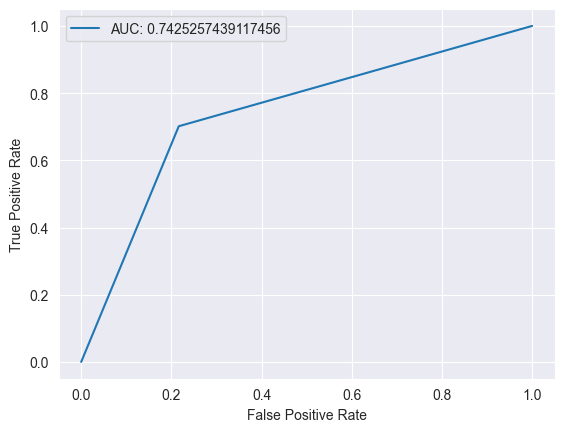

In [ ]:
roc(Y_test, pred)

In [ ]:
from xgboost import XGBClassifier
model = XGBClassifier()
model.fit(X_train, Y_train)
importances_tree = pd.DataFrame({'Features':X.columns, 'Importance':model.feature_importances_}).sort_values(by='Importance', ascending=False)
importances_tree

,Features,Importance
0,F0,0.488657
2,F2,0.313708
1,F1,0.197635


              precision    recall  f1-score   support

           0       0.83      0.89      0.86     17610
           1       0.84      0.76      0.80     13469

    accuracy                           0.84     31079
   macro avg       0.84      0.83      0.83     31079
weighted avg       0.84      0.84      0.84     31079



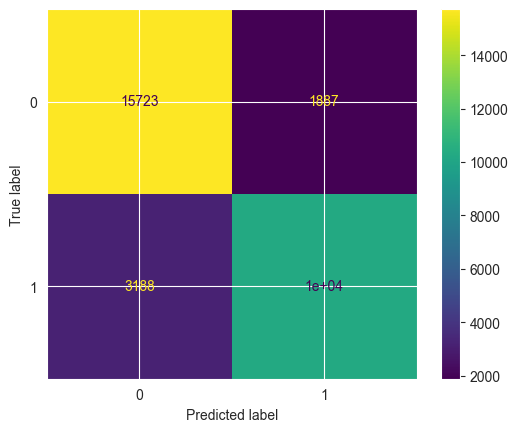

In [ ]:
pred = model.predict(X_test)
cm = confusion_matrix(Y_test, pred)
ConfusionMatrixDisplay(cm).plot()
print(classification_report(Y_test, pred))

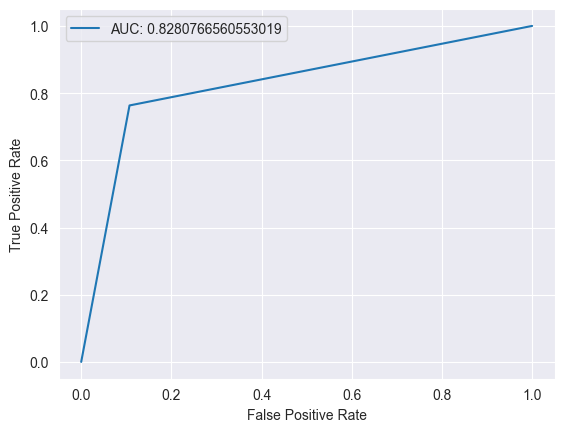

In [ ]:
roc(Y_test, pred)

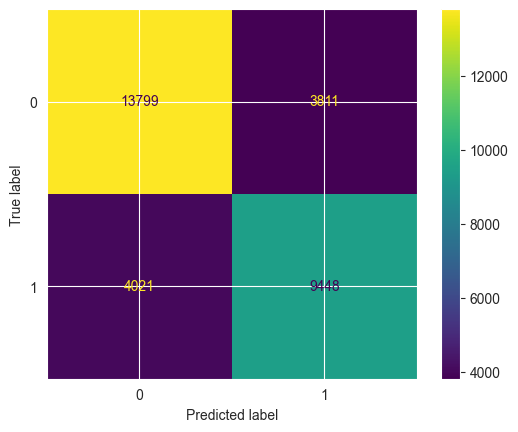

              precision    recall  f1-score   support

           0       0.77      0.78      0.78     17610
           1       0.71      0.70      0.71     13469

    accuracy                           0.75     31079
   macro avg       0.74      0.74      0.74     31079
weighted avg       0.75      0.75      0.75     31079



In [ ]:
pred = lg.predict(X_test)
cm = confusion_matrix(Y_test, pred)
ConfusionMatrixDisplay(cm).plot()
plt.show()
print(classification_report(Y_test, pred))

## Clustering

In [ ]:
fa_df

,F0,F1,F2,satisfaction
0,4.6,4.0,2.75,0
1,1.4,2.8,2.75,0
2,5.0,3.8,2.00,1
3,2.0,3.0,4.25,0
4,4.0,3.4,3.00,1
...,...,...,...,...
103899,2.0,2.6,2.00,0
103900,4.0,5.0,4.00,1
103901,3.6,3.8,1.50,0
103902,1.0,3.8,2.00,0


In [ ]:
rest_vars

,Gender,Customer Type,Age,Type of Travel,Flight Distance,Departure Delay in Minutes,Arrival Delay in Minutes
0,0,0,13,0,460,25,18.0
1,0,1,25,1,235,1,6.0
2,1,0,26,1,1142,0,0.0
3,1,0,25,1,562,11,9.0
4,0,0,61,1,214,0,0.0
...,...,...,...,...,...,...,...
103899,1,1,23,1,192,3,0.0
103900,0,0,49,1,2347,0,0.0
103901,0,1,30,1,1995,7,14.0
103902,1,1,22,1,1000,0,0.0


In [ ]:
clust_set = pd.concat([rest_vars, fa_df], axis=1)

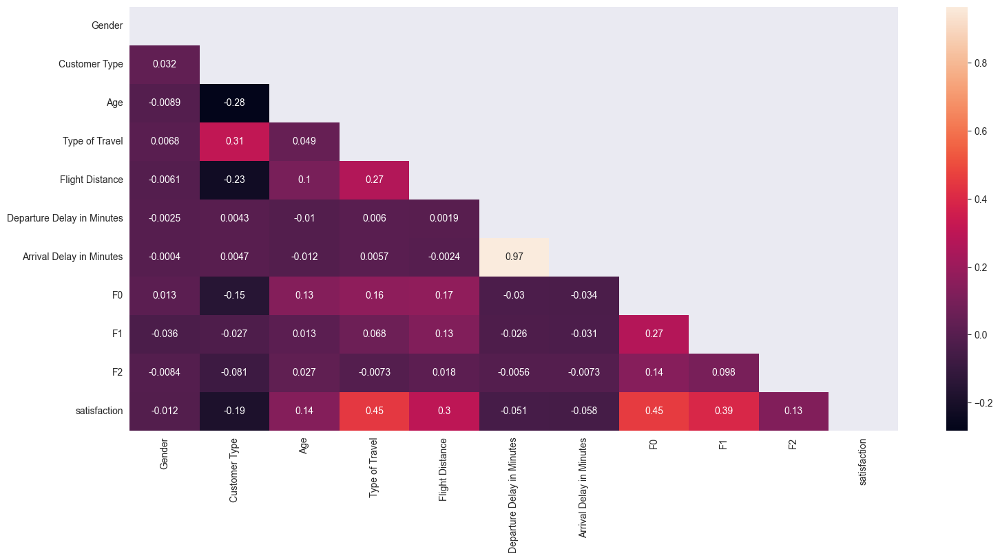

In [ ]:
cor = clust_set.corr(method='pearson')
mask = np.zeros_like(cor, dtype=bool)
mask[np.triu_indices_from(mask)] = True
plt.figure(figsize=(18, 8))
sns.heatmap(cor, mask=mask, annot=True)
plt.show()

In [ ]:
clust_set.drop(['Arrival Delay in Minutes'], axis=1, inplace=True)

In [ ]:
unsat = clust_set[clust_set.satisfaction==0].drop(['satisfaction'], axis=1)
sat = clust_set[clust_set.satisfaction==1].drop(['satisfaction'], axis=1)

### K-Means

In [ ]:
from sklearn.cluster import KMeans

In [ ]:
def elbow(data):
    inertia = []
    for i in range(2,12):
        k = KMeans(n_clusters=i)
        k.fit(data)
        inertia.append(k.inertia_)
    print(inertia)
    return inertia

In [ ]:
insertia_unsat = elbow(unsat)
insertia_sat = elbow(sat)

[10665350037.33947, 5290057799.6591835, 3175578775.4722505, 1961278144.4837108, 1313414971.1017692, 1073407430.4152197, 869504650.7171268, 727336464.824175, 594819820.6054341, 509097647.791528]
[13781370874.26762, 5703428291.793992, 3397545993.8582234, 2050866114.3982215, 1474293175.4360163, 1146250588.2813284, 863304877.1258955, 714887008.0145341, 610412647.9435596, 510898078.8781313]


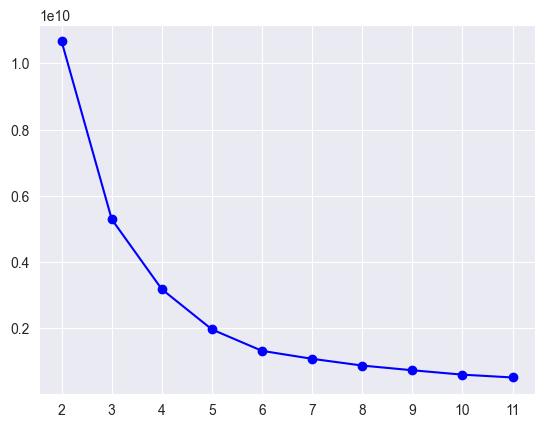

In [ ]:
plt.plot(range(2,12), insertia_unsat, 'o-b')
plt.xticks(np.arange(min(range(2,12)), max(range(2,12))+1, 1))
plt.show()

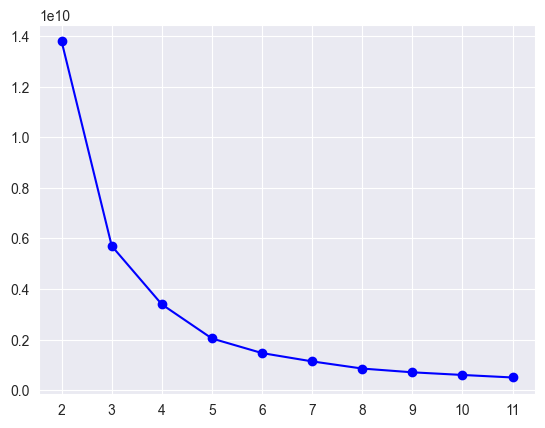

In [ ]:
plt.plot(range(2,12), insertia_sat, 'o-b')
plt.xticks(np.arange(min(range(2,12)), max(range(2,12))+1, 1))
plt.show()

In [ ]:
kmeans = KMeans(n_clusters=5)
kmeans.fit(unsat)
unsat['label'] = kmeans.labels_.astype('object')
unsat

,Gender,Customer Type,Age,Type of Travel,Flight Distance,Departure Delay in Minutes,F0,F1,F2,label
0,0,0,13,0,460,25,4.6,4.0,2.75,0
1,0,1,25,1,235,1,1.4,2.8,2.75,0
3,1,0,25,1,562,11,2.0,3.0,4.25,0
5,1,0,26,0,1180,0,1.2,3.8,2.50,4
6,0,0,47,0,1276,9,2.0,3.6,2.75,2
...,...,...,...,...,...,...,...,...,...,...
103898,0,0,50,0,1620,0,2.2,3.4,2.75,2
103899,1,1,23,1,192,3,2.0,2.6,2.00,0
103901,0,1,30,1,1995,7,3.6,3.8,1.50,2
103902,1,1,22,1,1000,0,1.0,3.8,2.00,4


In [ ]:
fig = px.scatter_3d(unsat, x='F0', y='F1', z='F2', color='label')
fig.update_traces(marker=dict(size=3))
fig.show()

clustering solo con los factores

In [ ]:
unsat=clust_set[clust_set.satisfaction==0][['F0', 'F1', 'F2']]
sat=clust_set[clust_set.satisfaction==1][['F0', 'F1', 'F2']]
insertia_unsat = elbow(unsat)
insertia_sat = elbow(sat)

[93481.41316374361, 74464.58695599089, 61715.12260732168, 53892.10851539718, 48377.90790886186, 43328.6456185306, 39865.17078706458, 36880.39534882909, 34374.06813993807, 32281.61233220398]
[78149.05612935378, 64347.79022144933, 54092.7475682371, 46074.37583920314, 39074.933609265114, 34752.804980461544, 32373.893928939928, 29935.642185867197, 28015.729773846942, 25983.72931584049]


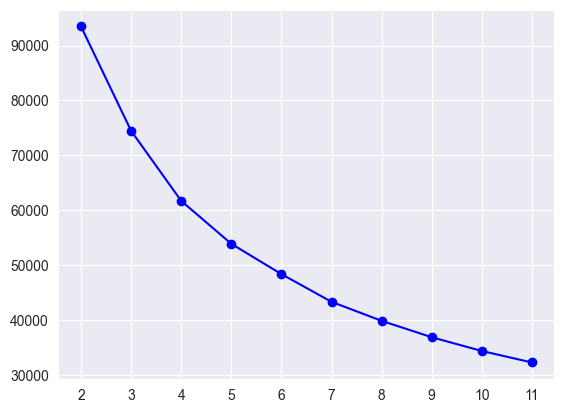

In [ ]:
plt.plot(range(2,12), insertia_unsat, 'o-b')
plt.xticks(np.arange(min(range(2,12)), max(range(2,12))+1, 1))
plt.show()

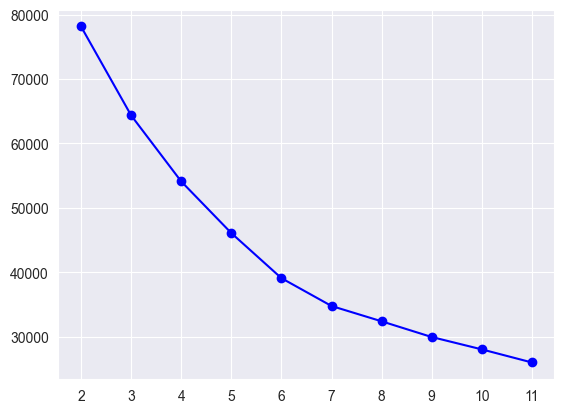

In [ ]:
plt.plot(range(2,12), insertia_sat, 'o-b')
plt.xticks(np.arange(min(range(2,12)), max(range(2,12))+1, 1))
plt.show()

In [ ]:
kmeans = KMeans(n_clusters=4)
kmeans.fit(unsat)
unsat['label'] = kmeans.labels_.astype('object')
unsat

,F0,F1,F2,label
0,4.6,4.0,2.75,0
1,1.4,2.8,2.75,3
3,2.0,3.0,4.25,1
5,1.2,3.8,2.50,3
6,2.0,3.6,2.75,3
...,...,...,...,...
103898,2.2,3.4,2.75,3
103899,2.0,2.6,2.00,2
103901,3.6,3.8,1.50,0
103902,1.0,3.8,2.00,3


In [ ]:
fig = px.scatter_3d(unsat, x='F0', y='F1', z='F2', color='label')
fig.update_traces(marker=dict(size=3))
fig.show()

### DBSCAN

In [ ]:
from sklearn.cluster import DBSCAN


Determine optimal epts using k-nn

In [ ]:
# from sklearn.neighbors import NearestNeighbors

# nn = NearestNeighbors(n_neighbors=.shape[1]+1)
# neighbours = nn.fit(df_norm.iloc[0:10000, :])
# distances, indices = neighbours.kneighbors(df_norm.iloc[0:10000, :])
# distances = np.sort(distances[:, df_norm.shape[1]], axis=0)
